# Snow Cover Extent
conda env: `work` (in `envs/phd`)

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
sys.path.insert(1, '/home/mlalande/notebooks/utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
# u.check_virtual_memory()

3.8.2 | packaged by conda-forge | (default, Feb 28 2020, 17:15:22) 
[GCC 7.3.0]


In [ ]:
# from dask.distributed import Client
# client = Client()
# client

In [ ]:
# client.close()

## Set variables

In [2]:
period = slice('1979','2014')
latlim, lonlim = u.get_domain_HMA()
seasons = ['Annual', 'DJFMA', 'JJAS']
# seasons = ['Annual']

# Make a extended version for regridding properly on the edges
latlim_ext, lonlim_ext = slice(latlim.start-5, latlim.stop+5), slice(lonlim.start-5, lonlim.stop+5)

# Get zone limits for annual cycle
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TP, latlim_TP = u.get_zones()

# HMA for full domain and the following for the above zones
zones = ['HMA', 'HK', 'HM', 'TP']
zones_df = pd.DataFrame(
    [[lonlim, latlim], [lonlim_HK, latlim_HK], [lonlim_HM, latlim_HM], [lonlim_TP, latlim_TP]], 
    columns=pd.Index(['lonlim', 'latlim'], name='Limits'),
    index=pd.Index(zones, name='Zones')
)

var = 'snc'
table = u.get_table(var)
label, units, cmap, levels = u.get_var_infos(var)
label

'Snow Cover Extent'

## Load topography

In [3]:
ds = xr.open_dataset('GMTED2010_15n240_1000deg.nc').drop_dims('nbounds').swap_dims(
    {'nlat': 'latitude', 'nlon': 'longitude'}).drop({'nlat', 'nlon'}).rename(
    {'latitude': 'lat', 'longitude': 'lon'}).sel(lat=latlim_ext, lon=lonlim_ext)
elevation = ds.elevation
elevation_std = ds.elevation_stddev

## Load obs
NOAA Climate Data Record (CDR) of Northern Hemisphere (NH) Snow Cover Extent (SCE), Version 1:
https://data.nodc.noaa.gov/cgi-bin/iso?id=gov.noaa.ncdc:C00756

In [4]:
obs_longname = 'NOAA Climate Data Record (CDR) Version 1'
obs_name = 'NOAA CDR'

ds_rutger = xr.open_dataset('/data/mlalande/RUTGERS/nhsce_v01r01_19661004_20191202.nc').sel(time=period)
with xr.set_options(keep_attrs=True): # Get the snc variable, keep only land data and convert to %
    obs = ds_rutger.snow_cover_extent.where(ds_rutger.land == 1)*100   
obs.attrs['units'] = '%'
obs = obs.rename({'longitude': 'lon', 'latitude': 'lat'}) # Rename lon and lat for the regrid

# Resamble data per month (from per week)
obs = obs.resample(time='1MS').mean('time', skipna=False, keep_attrs=True)

temp = []
for season in seasons:
    temp.append(
        u.clim(obs, calendar='standard', season=season)
    )

# Compute climatology and annual cycle
obs_clim = xr.combine_nested(temp, concat_dim='season')
obs_ac = u.annual_cycle(obs, calendar='standard')

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/xarray/core/resample.py:176: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  super().__init__(*args, **kwargs)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/xarray/core/common.py:663: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  return self._groupby_cls(


In [ ]:
# obs_clim[2].plot()
# obs_ac
# u.spatial_average(obs_ac).plot()

## Regrid obs towards the elevation grid of 1°x1°
Using xESMF (https://xesmf.readthedocs.io/en/latest/)

In [5]:
# Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
import scipy
def add_matrix_NaNs(regridder):
        X = regridder.weights
        M = scipy.sparse.csr_matrix(X)
        num_nonzeros = np.diff(M.indptr)
        M[num_nonzeros == 0, 0] = np.NaN
        regridder.weights = scipy.sparse.coo_matrix(M)
        return regridder

regridder = xe.Regridder(obs_clim, elevation, 'bilinear', periodic=False, reuse_weights=True)
regridder = add_matrix_NaNs(regridder)
obs_clim_regrid = regridder(obs_clim)
obs_clim_regrid.attrs['long_name'] = label
obs_clim_regrid.attrs['units'] = units

# Compute annual cycle for each zones
temp = [None]*len(zones)
obs_ac_regrid = regridder(obs_ac)
for i, zone in enumerate(zones):
    temp[i] = u.spatial_average(
        obs_ac_regrid.sel(lat=zones_df.latlim[zone], lon=zones_df.lonlim[zone]).where(elevation > 2500)
    )

obs_ac_regrid_zones = xr.concat(temp, pd.Index(zones, name="zone")).load()

Reuse existing file: bilinear_88x88_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/scipy/sparse/_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


In [ ]:
# obs_clim_regrid[0].plot()
# obs_ac_regrid_zones.plot(col='zone')

[#Load-results](#Load-results)

## Load models

In [ ]:
# '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/'+grid+'/latest/'

In [6]:
list_models = u.get_model_names()
# list_models = list_models[:1]
# list_models = ['MPI-ESM-1-2-HAM']

# Create empty lists for storing results before to concatenate them (for models + ensemble mean and seasons)
# Be carefull with *, see https://snakify.org/fr/lessons/two_dimensional_lists_arrays/#section_2
resolution = [None]*(len(list_models)+1)
annual_cycle = [[None] * (len(list_models)) for i in range(len(zones))]
bias = [[None] * (len(list_models)+1) for i in range(len(seasons))]
rmse = [[None] * (len(list_models)+1) for i in range(len(seasons))]
mb = [[None] * (len(list_models)+1) for i in range(len(seasons))]

for i, model in enumerate(list_models):
    print(model + ' ('+str(i+1)+'/'+str(len(list_models))+')')
    institute, grid, realization, calendar = u.get_model_infos(model, var)
    ds = xr.open_mfdataset(
        '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/'+grid+'/latest/*.nc', 
        combine='by_coords').sel(time=period, lat=latlim_ext, lon=lonlim_ext)[var]
    
    # Check if the time steps are ok
    np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, ds.time.size)
    
    # snc (0-1 to % when needed and take out wrong values)
    #########################################################################################
    
    # Some models have values between 0 and 1 even if units in %    
    if ds.max().values <= 1.1:
        ds = ds*100
    ds
    
    # Some models have wrong values (+-0.1 for numeric precision)
    ds = ds.where( (ds >= -0.1) & (ds <= 100.1) )
    
    #########################################################################################
    
    # Print resolution and save it
    lat = (ds.lat[1] - ds.lat[0]).values; lon = (ds.lon[1] - ds.lon[0]).values
    print(str(lon.round(3))+'°x'+str(lat.round(3))+'°')
    resolution[i] = str(lon.round(1))+'°x'+str(lat.round(1))+'°'
    
    # Make regridder
    regridder = xe.Regridder(ds, elevation, 'bilinear', periodic=False, reuse_weights=True)
    
    # Compute annual cycle for all HMA domain (>2500m) + zones
    ac = u.annual_cycle(ds, calendar=calendar)
    ac_regrid = regridder(ac)
    for z, zone in enumerate(zones):
        annual_cycle[z][i] = u.spatial_average(
            ac_regrid.sel(lat=zones_df.latlim[zone], lon=zones_df.lonlim[zone]).where(elevation > 2500)
        )
    
    # Compute metrics on the only HMA zone
    for k, season in enumerate(seasons):
#         print(season)
     
        # Compute climatology
        model_clim = u.clim(ds, calendar=calendar, season=season)

        # Regrid towards elevation grid 1°x1°
        model_clim_regrid = regridder(model_clim)

        # Compute the bias (k for season, i for model) on all domain
        bias[k][i] = (model_clim_regrid - obs_clim_regrid.sel(season=season)).sel(lat=latlim, lon=lonlim).load()
        
        # Compute the pattern/spatial area-weighted RMSE and mean bias (for HMA > 2500 m)
        rmse[k][i] = np.sqrt(u.spatial_average(bias[k][i].where(elevation > 2500)**2))
        mb[k][i] = u.spatial_average(bias[k][i].where(elevation > 2500))
        
    print('\n')

BCC-CSM2-MR (1/28)
1.125°x1.121°
Reuse existing file: bilinear_32x54_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



BCC-ESM1 (2/28)
2.812°x2.791°
Reuse existing file: bilinear_13x21_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CAS-ESM2-0 (3/28)
1.406°x1.417°
Reuse existing file: bilinear_24x42_35x60.nc


CESM2 (4/28)


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/xarray/conventions.py:487: SerializationWarning: variable 'snc' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


1.25°x0.942°
Reuse existing file: bilinear_37x49_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CESM2-FV2 (5/28)
2.5°x1.895°
Reuse existing file: bilinear_18x25_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CESM2-WACCM (6/28)


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/xarray/conventions.py:487: SerializationWarning: variable 'snc' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


1.25°x0.942°
Reuse existing file: bilinear_37x49_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CESM2-WACCM-FV2 (7/28)
2.5°x1.895°
Reuse existing file: bilinear_18x25_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CIESM (8/28)
1.25°x0.942°
Reuse existing file: bilinear_37x49_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CNRM-CM6-1 (9/28)
1.406°x1.401°
Reuse existing file: bilinear_25x42_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CNRM-CM6-1-HR (10/28)
0.5°x0.499°
Reuse existing file: bilinear_70x121_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CNRM-ESM2-1 (11/28)
1.406°x1.401°
Reuse existing file: bilinear_25x42_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



CanESM5 (12/28)
2.812°x2.791°
Reuse existing file: bilinear_13x21_35x60.nc


CanESM5-CanOE (13/28)
2.812°x2.791°
Reuse existing file: bilinear_13x21_35x60.nc


GFDL-CM4 (14/28)
1.25°x1.0°
Reuse existing file: bilinear_35x48_35x60.nc


GISS-E2-1-G (15/28)
2.5°x2.0°
Reuse existing file: bilinear_18x24_35x60.nc


GISS-E2-1-H (16/28)
2.5°x2.0°
Reuse existing file: bilinear_18x24_35x60.nc


HadGEM3-GC31-LL (17/28)
1.875°x1.25°
Reuse existing file: bilinear_28x32_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



HadGEM3-GC31-MM (18/28)
0.833°x0.556°
Reuse existing file: bilinear_63x72_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



IPSL-CM6A-LR (19/28)
2.5°x1.268°
Reuse existing file: bilinear_28x25_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



MIROC-ES2L (20/28)
2.812°x2.791°
Reuse existing file: bilinear_13x21_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



MIROC6 (21/28)
1.406°x1.401°
Reuse existing file: bilinear_25x42_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



MPI-ESM1-2-HR (22/28)
0.938°x0.935°
Reuse existing file: bilinear_37x64_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



MPI-ESM1-2-LR (23/28)
1.875°x1.865°
Reuse existing file: bilinear_19x32_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



MRI-ESM2-0 (24/28)
1.125°x1.121°
Reuse existing file: bilinear_32x54_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



NorESM2-LM (25/28)
2.5°x1.895°
Reuse existing file: bilinear_18x25_35x60.nc


SAM0-UNICON (26/28)
1.25°x0.942°
Reuse existing file: bilinear_37x49_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/



TaiESM1 (27/28)
1.25°x0.942°
Reuse existing file: bilinear_37x49_35x60.nc


UKESM1-0-LL (28/28)
1.875°x1.25°
Reuse existing file: bilinear_28x32_35x60.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)


## Make multi-model ensemble and average for metrics

In [7]:
# Index -1 is for mmm (Multi-Model Mean)

temp = [None] * len(seasons)
for k, season in enumerate(seasons):
    # Concatenate the multimodel ensemble (bias[k][:-1] not to take the last indice for mmm that is None)
    multimodel_ensemble_bias = xr.concat(
        bias[k][:-1], pd.Index(list_models, name="model"), coords='minimal', compat='override'
    )

    # Compute multimodel mean
    mmm_bias = multimodel_ensemble_bias.mean('model')
    
    # Add resolution
    resolution[-1] = '1°x1°'
    
    # Add the bias and metrics in position -1 (for mmm)
    bias[k][-1] = mmm_bias
    rmse[k][-1] = np.sqrt(u.spatial_average(mmm_bias.where(elevation > 2500)**2))
    mb[k][-1] = u.spatial_average(mmm_bias.where(elevation > 2500))

    list_models_mmm = list_models.copy()
    list_models_mmm.append('Multi-Model Mean')


    # Concatenate the mmm of the multimodel_ensemble_bias
    temp[k] = xr.concat(
        bias[k], pd.Index(list_models_mmm, name="model"), coords='minimal', compat='override'
    )

    # Add the rmse and mb as coordinates
    temp[k] = temp[k].assign_coords({
        'rmse': ('model', rmse[k]),
        'mean_bias': ('model', mb[k]),
        'resolution': ('model', resolution),
    })
    
    
# Concatenate the mmm of the multimodel_ensemble_bias
multimodel_ensemble_bias_mmm = xr.concat(temp, pd.Index(seasons, name="season"))

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


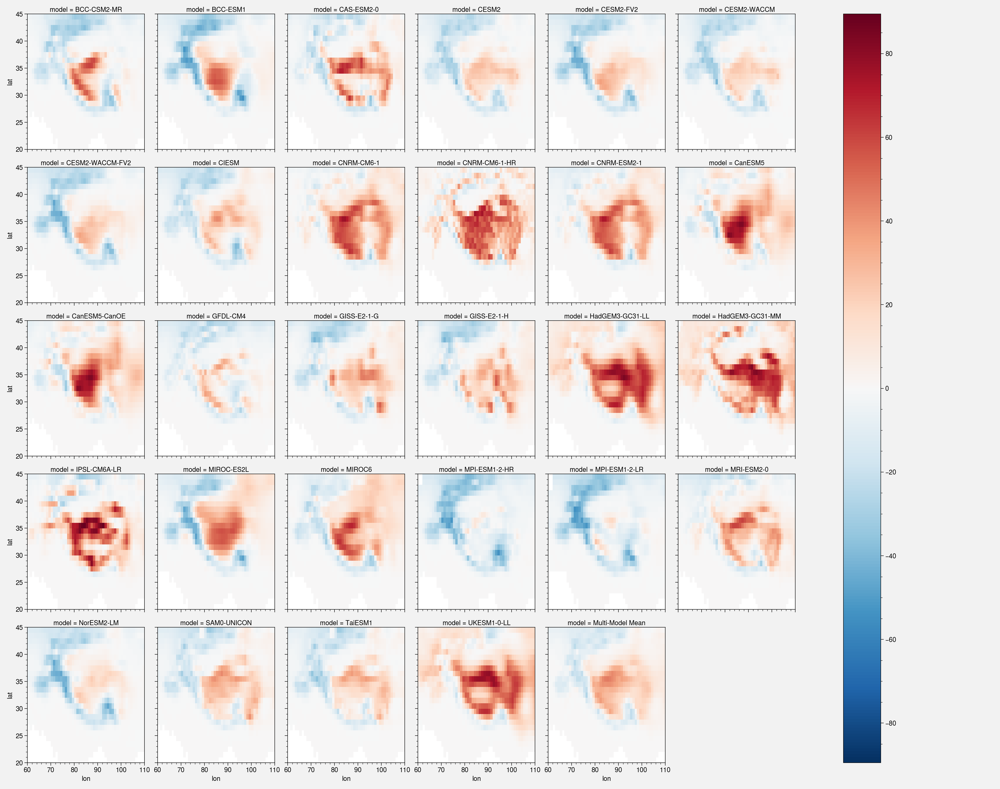

In [8]:
multimodel_ensemble_bias_mmm[0].plot(col='model', col_wrap=6)

## Concatenate annual cycle

In [9]:
temp = [None]*len(zones)

for i, zone in enumerate(zones):
    temp[i] = xr.concat(annual_cycle[i], pd.Index(list_models, name="model"), 
                        coords='minimal', compat='override')
    
multimodel_ensemble_ac = xr.concat(temp, pd.Index(zones, name="zone")).load()

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)


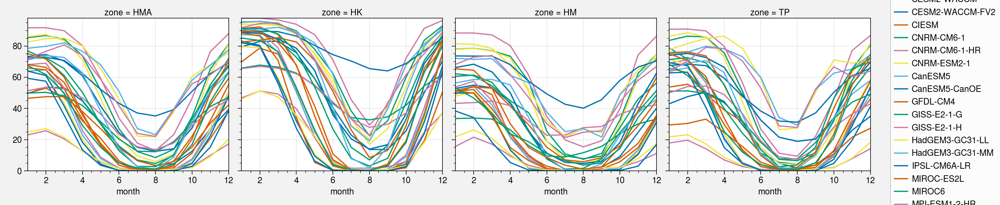

In [10]:
multimodel_ensemble_ac.plot(col='zone', hue='model', x='month')

## Save results

In [11]:
multimodel_ensemble_bias_mmm.attrs['long_name'] = label
multimodel_ensemble_bias_mmm.attrs['units'] = units
multimodel_ensemble_bias_mmm.attrs['period'] = period.start+'-'+period.stop

multimodel_ensemble_bias_mmm.to_netcdf(
    'results/'+var+'_'+period.start+'-'+period.stop+'multimodel_ensemble_bias_mmm.nc'
)


multimodel_ensemble_ac.attrs['long_name'] = label
multimodel_ensemble_ac.attrs['units'] = units
multimodel_ensemble_ac.attrs['period'] = period.start+'-'+period.stop

multimodel_ensemble_ac.to_netcdf(
    'results/'+var+'_'+period.start+'-'+period.stop+'multimodel_ensemble_ac.nc'
)

## Load results

In [12]:
# mmm: multimodel mean (is at the last index)
multimodel_ensemble_bias_mmm = xr.open_dataarray(
    'results/'+var+'_'+period.start+'-'+period.stop+'multimodel_ensemble_bias_mmm.nc'
)

multimodel_ensemble_ac = xr.open_dataarray(
    'results/'+var+'_'+period.start+'-'+period.stop+'multimodel_ensemble_ac.nc'
)

In [15]:
# multimodel_ensemble_bias_mmm
# multimodel_ensemble_ac

# Bias
## Check min and max
### Model

In [16]:
for season in seasons:
    print(
        season,
        multimodel_ensemble_bias_mmm.sel(season=season).min().values, 
        multimodel_ensemble_bias_mmm.sel(season=season).max().values
    )

Annual -54.153586298936496 89.47062794156025
DJFMA -78.69156500401931 93.04437097731854
JJAS -59.66697035507403 98.87066409864082


In [17]:
multimodel_ensemble_bias_mmm.min().values, multimodel_ensemble_bias_mmm.max().values

(array(-78.691565), array(98.8706641))

### Obs

In [18]:
for season in seasons:
    print(
        season,
        obs_clim_regrid.sel(season=season).min().values, 
        obs_clim_regrid.sel(season=season).max().values
    )

Annual 0.0 83.07365003887891
DJFMA 0.0 99.06161519828403
JJAS 0.0 59.675969195613035


In [19]:
obs_clim_regrid.min().values, obs_clim_regrid.max().values

(array(0.), array(99.0616152))

## Make final plots (for each season)

In [ ]:
# import warnings
# warnings.filterwarnings('ignore')

### Plots obs separetly

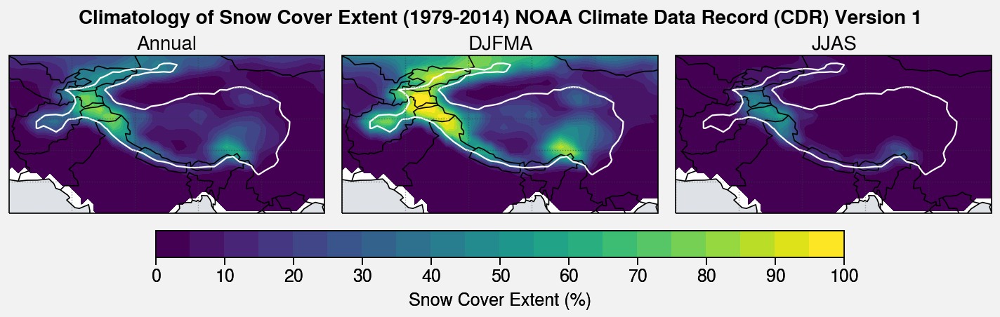

In [67]:
f, axs = plot.subplots(proj='cyl', ncols=3, nrows=1)

for i, ax in enumerate(axs):
    # Add contour 2500 m
    ax.contour(elevation, levels=[2500], color='white', linewidth=0.8)

    # Plot observation
    m = ax.contourf(
        obs_clim_regrid.isel(season=i), cmap=cmap, 
        levels=plot.arange(0,100,5), 
        extend='neither', 
#         norm='midpoint'
    )
    ax.format(title=str(obs_clim_regrid.isel(season=i).season.values))


f.colorbar(m, label = label + ' ('+units+')', loc='b', length=0.7)

axs.format(
    # Grids, labels and limits
    geogridlinewidth = 0.5, geogridcolor = 'gray8', geogridalpha = 0.5, labels = False,
    lonlines=10, latlines=5, latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),

    # Add coast, ocean, borders
    coast = True, ocean = True, oceancolor = 'gray3', borders = True,

    # Suptitle
    suptitle = 'Climatology of '+label+' ('+period.start+'-'+period.stop+') ' + obs_longname  
)

# filename = 'clim_obs_'+var+'_'+period.start+'-'+period.stop
# f.save('img/'+filename+'.jpg'); f.save('img/'+filename+'.png'); f.save('img/'+filename+'.pdf')

### Plot just biases with multimodel at the end (+1 ax)

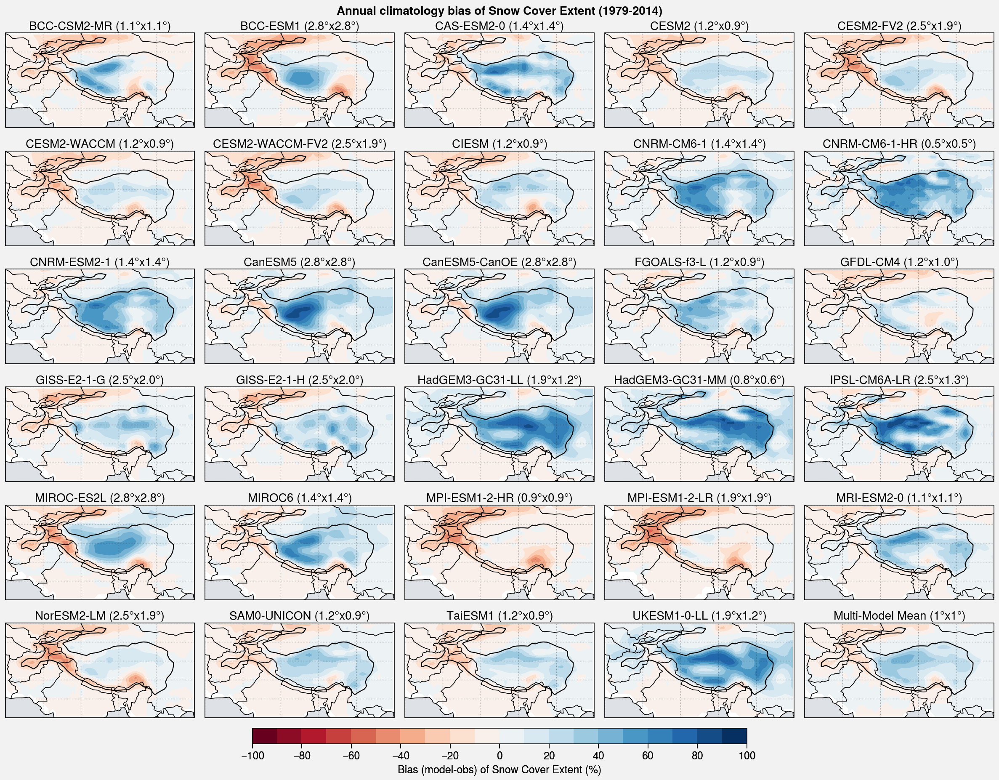

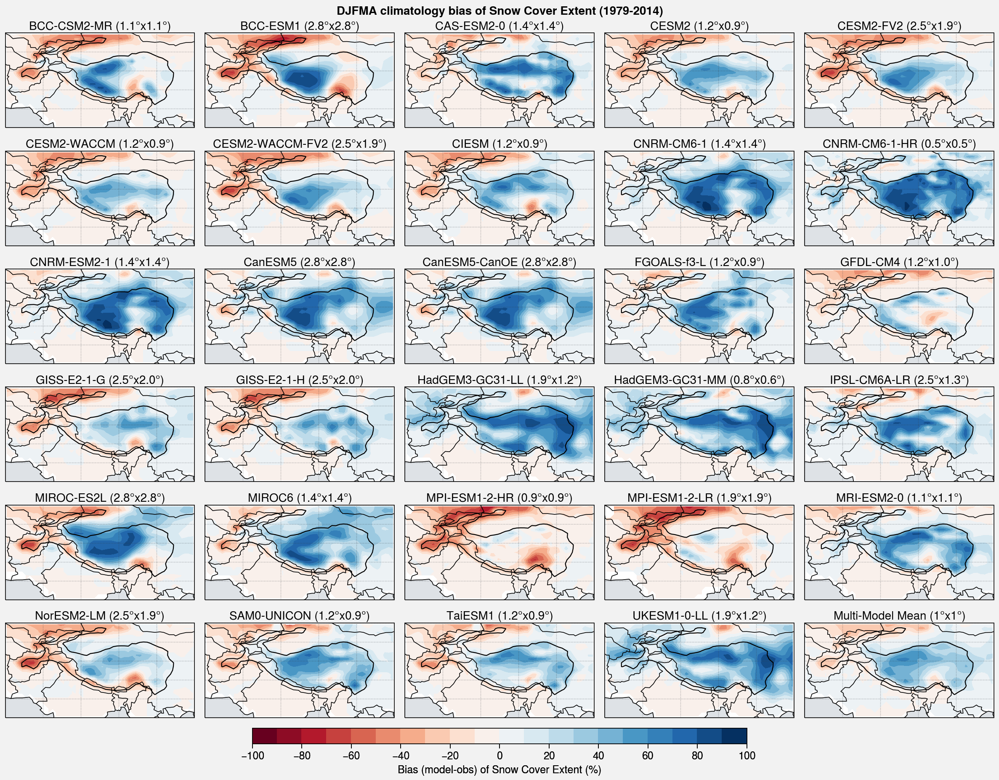

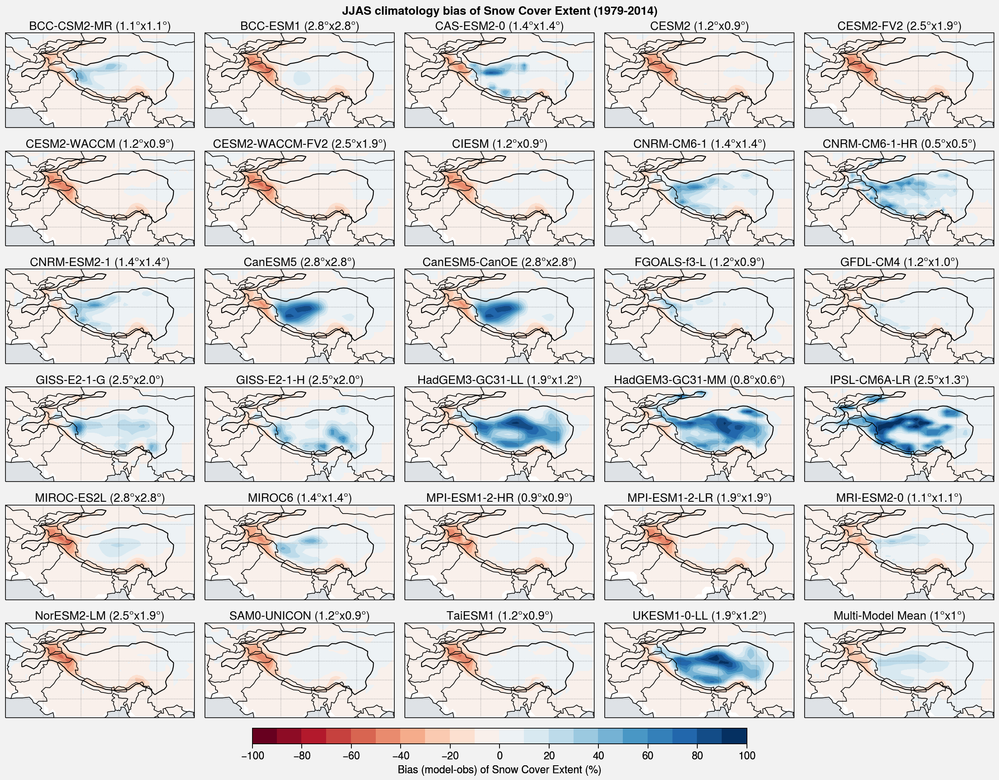

In [46]:
# for season in seasons:
# # for season in ['Annual']:
#     f, axs = plot.subplots(proj='cyl', ncols=5, nrows=6)

#     for i, ax in enumerate(axs):
#         # Add contour 2500 m
#         ax.contour(elevation, levels=[2500], color='black', linewidth=0.8)

#         # Plot
#         m = ax.contourf(
#             multimodel_ensemble_bias_mmm.sel(season=season)[i], 
#             cmap = 'RdBu', 
#             levels = plot.arange(-100,100,10),
#             extend = 'neither'
#         ),

#         # Text
#         ax.format(
#             # Title: model name + resolution
#             title = str(
#                 multimodel_ensemble_bias_mmm.sel(season=season).model[i].values
#             )+' ('+str(
#                 multimodel_ensemble_bias_mmm.sel(season=season).resolution[i].values
#             )+')',
#         )

#     f.colorbar(m, label='Bias (model-obs) of '+label+' ('+units+')', loc='b', length=0.5)

#     axs.format(
#         # Grids, labels and limits
#         geogridlinewidth = 0.5, geogridcolor = 'gray8', geogridalpha = 0.5, labels = False,
#         lonlines=10, latlines=5, latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
        
#         # Add coast, ocean, borders
#         coast = True, ocean = True, oceancolor = 'gray3', borders = True,
        
#         # Suptitle
#         suptitle = season+' climatology bias of '+label+' ('+period.start+'-'+period.stop+')'   
#     )
    
# #     filename = season+'_clim_bias_'+var+'_'+period.start+'-'+period.stop
# #     f.save('img/'+filename+'.jpg'); f.save('img/'+filename+'.png'); f.save('img/'+filename+'.pdf')

### Make all plot together with obs first and multimodel at the end (+2 ax)

In [23]:
obs_name

'NOAA CDR'

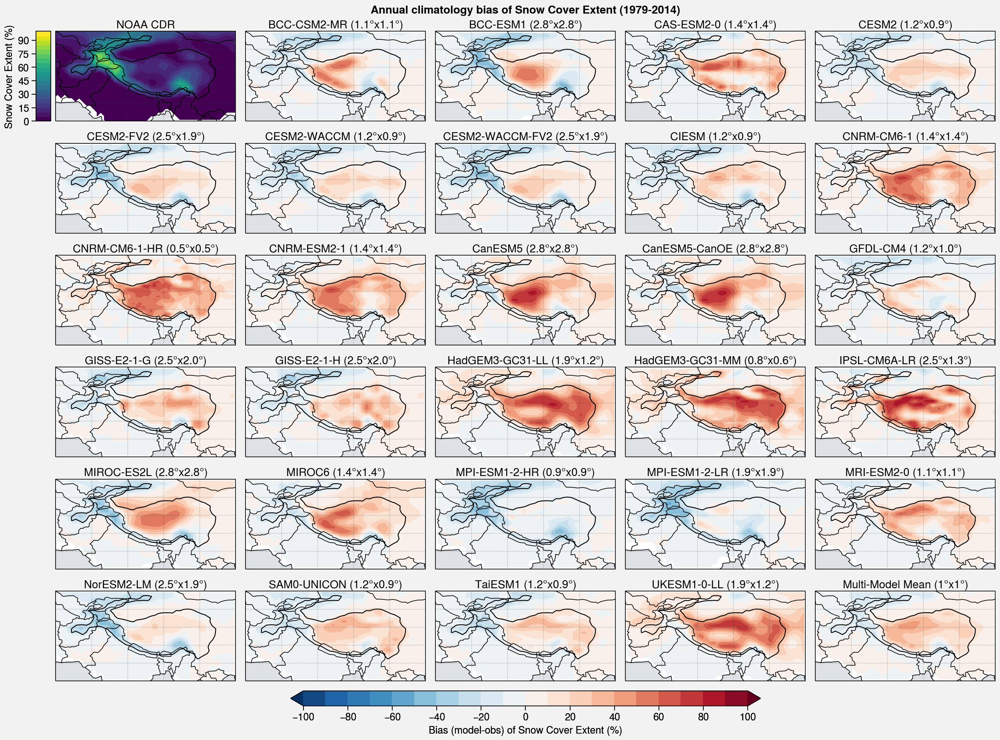

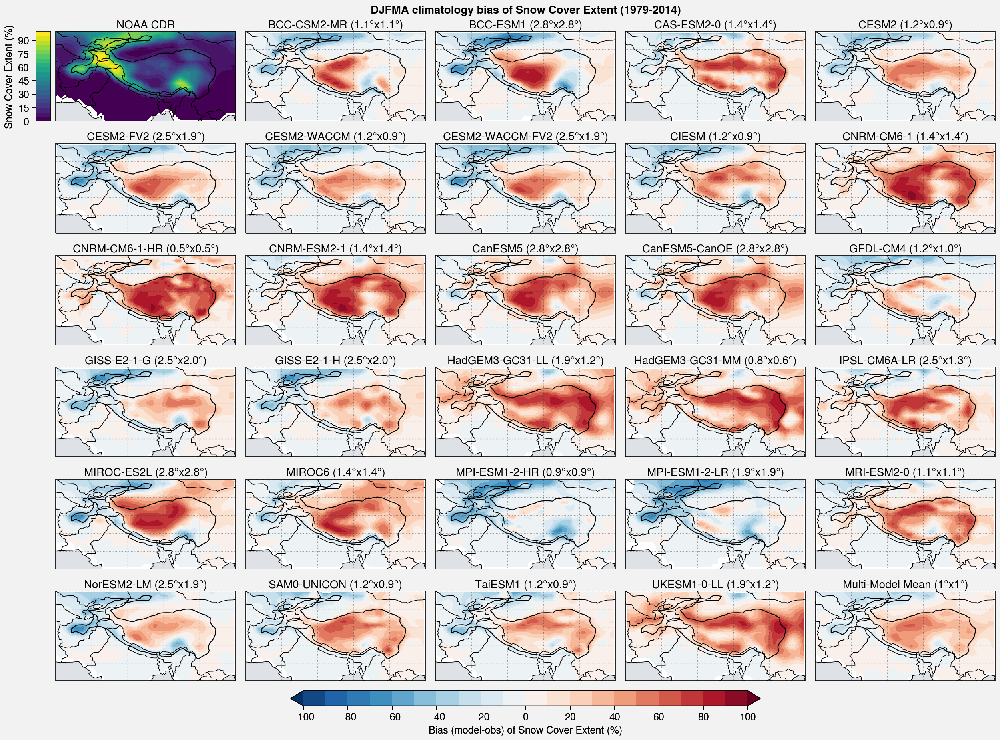

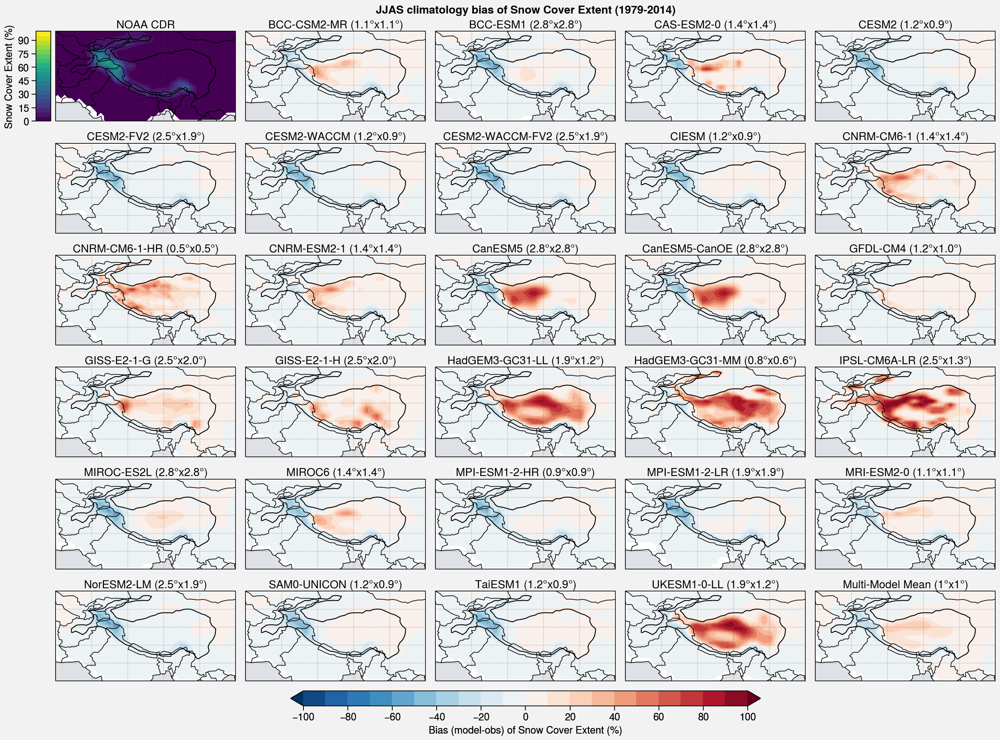

In [24]:
for season in seasons:
    f, axs = plot.subplots(proj='cyl', ncols=5, nrows=6)

    for i, ax in enumerate(axs):
        # Add contour 2500 m
        ax.contour(elevation, levels=[2500], color='black', linewidth=0.8)

        # Plot observation
        if i == 0:
            ax.contourf(
                obs_clim_regrid.sel(season=season), cmap=cmap, levels=plot.arange(0,100,5), 
                colorbar='l', extend='neither'
            )
            ax.format(title=obs_name)

        # Plot model bias
        else:
            # Plot ([i-1] because the first plot is the obs)
            m = ax.contourf(
                multimodel_ensemble_bias_mmm.sel(season=season)[i-1], 
                cmap = 'RdBu_r', 
                levels = plot.arange(-100,100,10),
                extend = 'both'
            ),
                
            
            # Text
            ax.format(
                # Title: model name + resolution
                title = str(
                    multimodel_ensemble_bias_mmm.sel(season=season).model[i-1].values
                )+' ('+str(
                    multimodel_ensemble_bias_mmm.sel(season=season).resolution[i-1].values
                )+')',
                
#                 # Lower left title: mean bias + RMSE
#                 lltitle = 'MB = '+str(
#                     multimodel_ensemble_bias_mmm.sel(season=season).mean_bias[i-1].round(1).values
#                 ) +' '+units+'\nRMSE = '+str(
#                              multimodel_ensemble_bias_mmm.sel(season=season).rmse[i-1].round(1).values
#                 ) +' '+units
            )

    f.colorbar(m, label='Bias (model-obs) of '+label+' ('+units+')', loc='b', length=0.5)

    axs.format(
        # Grids, labels and limits
        geogridlinewidth = 0.5, geogridcolor = 'gray8', geogridalpha = 0.5, labels = False,
        lonlines=10, latlines=5, latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
        
        # Add coast, ocean, borders
        coast = True, ocean = True, oceancolor = 'gray3', borders = True,
        
        # Suptitle
        suptitle = season+' climatology bias of '+label+' ('+period.start+'-'+period.stop+')'   
    )
    
#     filename = season+'_clim_bias_'+var+'_'+period.start+'-'+period.stop
#     f.save('img/'+filename+'.jpg'); f.save('img/'+filename+'.png'); f.save('img/'+filename+'.pdf')

# Metrics

In [47]:
# Data shape (season, model, metric)

list_data = [None]*len(seasons)

# Keep the multimodel mean separate ([:-1])
model_sorted_annual = multimodel_ensemble_bias_mmm.sel(season='Annual')[:-1].sortby(
#                       'rmse', ascending=False).model.values
                      'rmse', ascending=True).model.values
# model_sorted_annual = np.insert(model_sorted_annual, 0, multimodel_ensemble_bias_mmm.model[-1].values)
model_sorted_annual = np.append(model_sorted_annual, multimodel_ensemble_bias_mmm.model[-1].values)

for i, season in enumerate(seasons):
    data = np.ndarray(shape=(multimodel_ensemble_bias_mmm.model.size, 2))
    
#     data[:,0] = multimodel_ensemble_bias_mmm.sel(season=season).sortby('rmse', ascending=False).rmse
#     data[:,1] = multimodel_ensemble_bias_mmm.sel(season=season).sortby('rmse', ascending=False).mean_bias

    data[:,0] = multimodel_ensemble_bias_mmm.sel(season=season).reindex(model=model_sorted_annual).rmse
    data[:,1] = multimodel_ensemble_bias_mmm.sel(season=season).reindex(model=model_sorted_annual).mean_bias

    list_data[i] = pd.DataFrame(
        data, columns=pd.Index(['RMSE', 'Mean Bias'], name='Metric'),
        index=pd.Index(model_sorted_annual, name='Model')
    )

# data

In [48]:
for i, season in enumerate(seasons):
    print(season)
    print(list_data[i].min())
    print(list_data[i].max())
    print('\n')

Annual
Metric
RMSE         12.531488
Mean Bias   -13.535411
dtype: float64
Metric
RMSE         44.690173
Mean Bias    37.206570
dtype: float64


DJFMA
Metric
RMSE         19.028864
Mean Bias   -17.370497
dtype: float64
Metric
RMSE         57.137763
Mean Bias    51.084109
dtype: float64


JJAS
Metric
RMSE         8.024210
Mean Bias   -8.212971
dtype: float64
Metric
RMSE         42.745302
Mean Bias    30.347022
dtype: float64




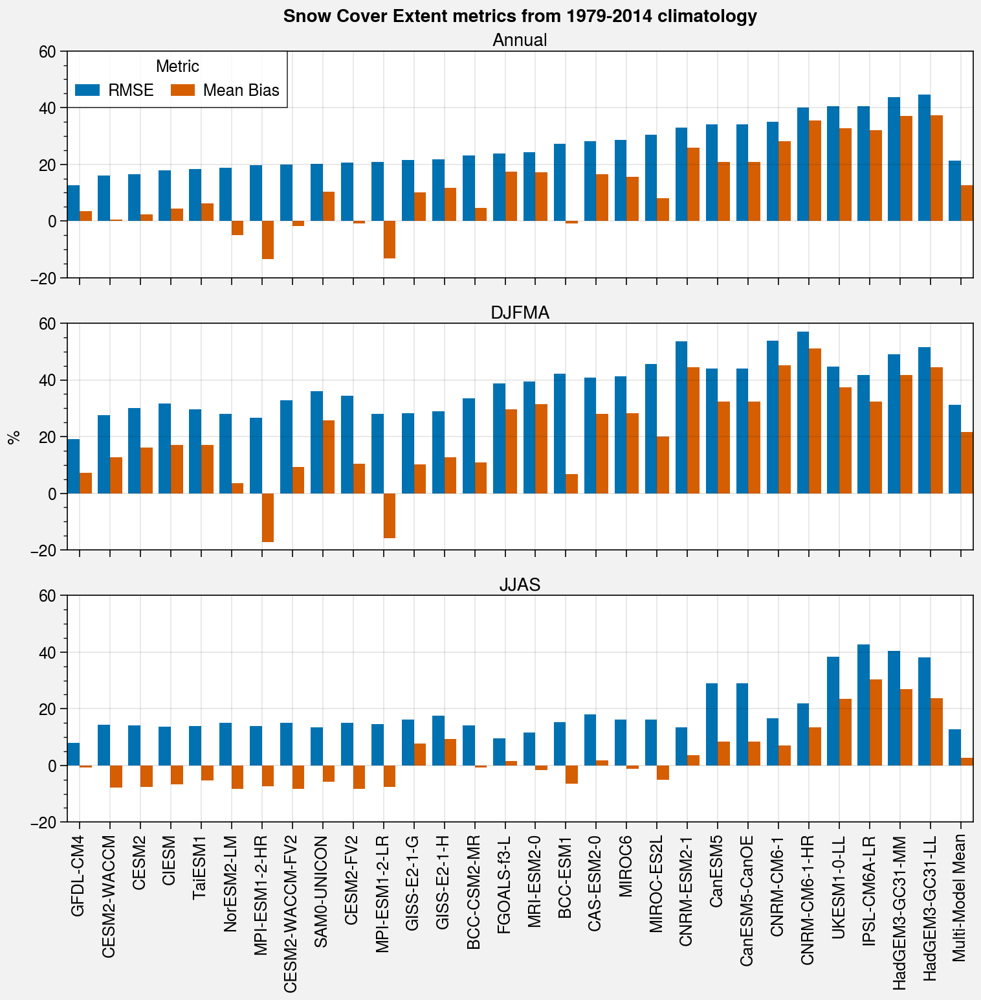

In [51]:
f, axs = plot.subplots(nrows=3, aspect=4, axwidth=7)

# lim = 13.5
cycle = '538'
for i, ax in enumerate(axs):
    if i == 0:
        ax.bar(list_data[i], legend='ul', linewidth=0)
    else:
        ax.bar(list_data[i], linewidth=0)

    ax.format(
        title = multimodel_ensemble_bias_mmm.isel(season=i).season.values,
        ylim = (-20,60), ylabel = units, xlabel='', xrotation=90,
        suptitle = label+' metrics from '+period.start+'-'+period.stop+' climatology'
    )
    
# filename = 'metrics_'+var+'_'+period.start+'-'+period.stop
# f.save('img/'+filename+'.jpg'); f.save('img/'+filename+'.png'); f.save('img/'+filename+'.pdf')

In [ ]:
# f, axs = plot.subplots(ncols=3, aspect=0.4)

# lim = 13.5
# for i, ax in enumerate(axs):
#     m = ax.barh(list_data[i])

#     ax.format(
#         title = multimodel_ensemble_bias_mmm.isel(season=i).season.values,
#         xlim = (-lim,lim), xlabel = 'RMSE (blue) / Mean Bias (red) ['+units+']',
#         suptitle = label+' ('+period.start+'-'+period.stop+')'
#     )
    
# filename = 'metrics_'+var+'_'+period.start+'-'+period.stop
# # f.save('img/'+filename+'.jpg'); f.save('img/'+filename+'.png'); f.save('img/'+filename+'.pdf')

# Annual cycles

## All

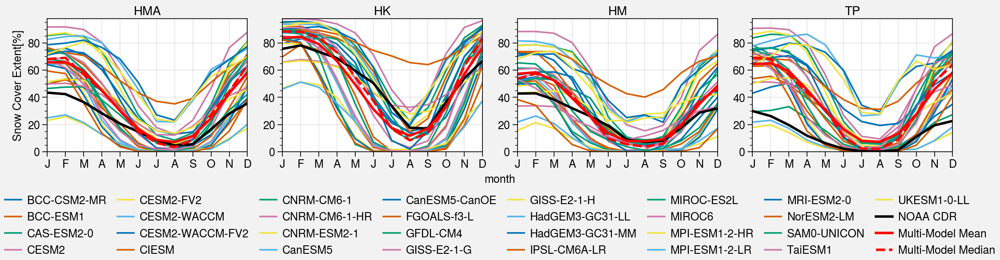

In [53]:
f, axs = plot.subplots(ncols=4, nrows=1, share=1, aspect=1.5)
hs = []

for i, ax in enumerate(axs):
    
    for model in multimodel_ensemble_ac.model.values:
        h = ax.plot(
            multimodel_ensemble_ac.isel(zone=i).sel(model=model), 
            label = str(multimodel_ensemble_ac.isel(zone=i).sel(model=model).model.values)
        )
        if i == 0:
            hs.append(h)

    # Plot observations
    h_obs = ax.plot(obs_ac_regrid_zones.isel(zone=i), label=obs_name, color='black', linewidth=2)
    if i == 0:
        hs.append(h_obs)
        
        
    # Add mean and median
    h = ax.plot(
        multimodel_ensemble_ac.isel(zone=i).mean('model'), label = 'Multi-Model Mean',
        color='red', linewidth=2
    )
    if i == 0:
        hs.append(h)
        
    h = ax.plot(
        multimodel_ensemble_ac.isel(zone=i).median('model'), label = 'Multi-Model Median',
        color='red', linewidth=2, linestyle='--'
    )
    if i == 0:
        hs.append(h)

    ax.format(
        title=zones[i],
        ylabel=label + '['+units+']', ylim=(multimodel_ensemble_ac.min(),multimodel_ensemble_ac.max()),
        xlocator='index', xformatter=['J','F','M','A','M','J','J','A','S','O','N','D'], xtickminor=False,
    )
    
f.legend(hs, loc='b', ncols=8, order='F', center=False, frame=False)

## Percentiles

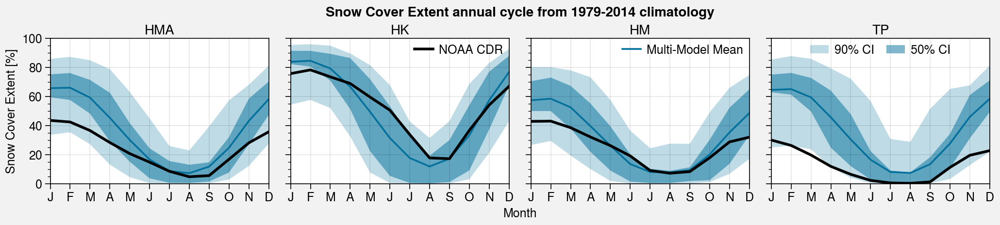

In [64]:
f, axs = plot.subplots(ncols=4, nrows=1, aspect=1.5)

# color_model = plot.Cycle('Set1').by_key()['color'][0]
# color_obs = plot.Cycle('Set1').by_key()['color'][1]

color_model = 'ocean blue'
color_obs = 'black'

for i, ax in enumerate(axs):
    means = multimodel_ensemble_ac[i].mean('model')
    
    # Compute quantiles 
    quantiles = multimodel_ensemble_ac[i].quantile([0.05, 0.25, 0.75, 0.95], dim='model')
    
    h1 = ax.plot(means, label='Multi-Model Mean', color=color_model)
    
    h11 = ax.fill_between(
        means.month, quantiles.sel(quantile=0.05), quantiles.sel(quantile=0.95), 
        alpha=0.25, label='90% CI', facecolor=color_model
    )
    h12 = ax.fill_between(
        means.month, quantiles.sel(quantile=0.25), quantiles.sel(quantile=0.75), 
        alpha=0.5, label='50% CI', facecolor=color_model
    )


    # Plot observations
    h2 = ax.plot(obs_ac_regrid_zones[i], label=obs_name, color=color_obs, linewidth=2)

    ax.format(
        title=zones[i], ylabel=label + ' ['+units+']', 
        ylim=(0, 100
#             multimodel_ensemble_ac.quantile(0.05, dim='model').min(),
#             multimodel_ensemble_ac.quantile(0.95, dim='model').max()
        ),
        xlocator='index', xformatter=['J','F','M','A','M','J','J','A','S','O','N','D'], xtickminor=False,
        xlabel='Month'
    )

axs[1].legend([h2], loc='ur', frame=False, order='F', center=False)    
axs[2].legend([h1], loc='ur', frame=False, order='F', center=False)    
axs[3].legend([h11, h12], loc='uc', frame=False, order='F', center=False)

axs.format(suptitle = label+' annual cycle from '+period.start+'-'+period.stop+' climatology')
    
# filename = 'ac_'+var+'_'+period.start+'-'+period.stop
# f.save('img/'+filename+'.jpg'); f.save('img/'+filename+'.png'); f.save('img/'+filename+'.pdf')

## STD

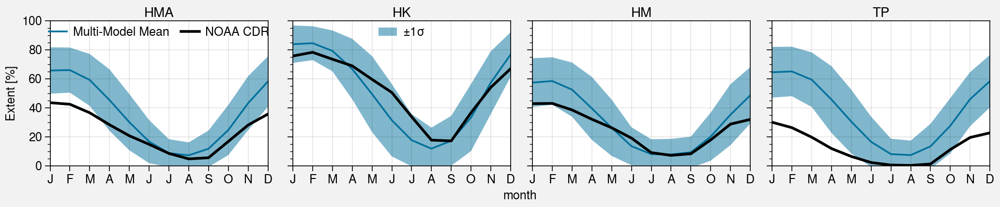

In [66]:
f, axs = plot.subplots(ncols=4, nrows=1, aspect=1.5)

color_model = 'ocean blue'
color_obs = 'black'

for i, ax in enumerate(axs):
    means = multimodel_ensemble_ac[i].mean('model')
    std = multimodel_ensemble_ac[i].std('model')
    
    h1 = ax.plot(means, label='Multi-Model Mean', color=color_model)
    
    h11 = ax.fill_between(
        means.month, means-std, means+std, 
        alpha=0.5, label='$\pm 1 \sigma$', facecolor=color_model
    )


    # Plot observations
    h2 = ax.plot(obs_ac_regrid_zones[i], label=obs_name, color=color_obs, linewidth=2)

    ax.format(
        title=zones[i], ylabel=label.split()[-1] + ' ['+units+']', 
        ylim=(0, 100
#             multimodel_ensemble_ac.quantile(0.05, dim='model').min(),
#             multimodel_ensemble_ac.quantile(0.95, dim='model').max()
        ),
        xlocator='index', xformatter=['J','F','M','A','M','J','J','A','S','O','N','D'], xtickminor=False,
    )

axs[0].legend([h1, h2], loc='uc', frame=False, order='F', center=False)
axs[1].legend(h11, loc='uc', frame=False, order='F', center=False) 